In [1]:
# TODO: use ryan-reynolds-small.jpg to simulate forward process and backward process of diffusion model
# TODO: use ryan for testing inpainting, colorization, super-resolution
# TODO: some faces work great in each task, keep ryan as stable and show better results as well.
# TODO: colorization: presence of sun glare as exagerated in the generation and look amazing.
# TODO: What is important is the way the tasks are preformed and your knowledge of the problem
# NOTE: use https://app.diagrams.net/ for diagrams, easy prototyping maybe(?) good export support

# Attention easier SSIM??? 
[LINK](https://github.com/csqiangwen/DeepFillv2_Pytorch/blob/e50547148d129ad1c4a63b48f04abe8ae9963f21/utils.py#L117)

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

: 

In [3]:
import os
os.chdir('/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap')
from BinomDataset_ffhq_inpaint_noaug import BinomDataset
from utils import preprocess, resize
import torch
import numpy as np
import matplotlib.pyplot as plt

In [3]:
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = 15
maxpsnr = 16
in_dataset_ffhq = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, imgsize= 256, masksize = 128)

In [ ]:
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/test/'
minpsnr = 15
maxpsnr = 16
in_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, imgsize= 256, masksize = 128)

In [4]:
img = in_dataset[0]
img, mask, gt, imgNoise = img[:3], img[3:4], img[4:7], img[7:]
plt.subplot(1, 4, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 4, 2)
plt.imshow(preprocess(mask), 'gray')
plt.subplot(1, 4, 3)
plt.imshow(preprocess(gt))
plt.subplot(1, 4, 4)
plt.imshow(preprocess(imgNoise))

Traceback (most recent call last):
  File "_pydevd_bundle/pydevd_cython.pyx", line 563, in _pydevd_bundle.pydevd_cython.PyDBFrame._handle_exception
  File "_pydevd_bundle/pydevd_cython.pyx", line 297, in _pydevd_bundle.pydevd_cython.PyDBFrame.do_wait_suspend
  File "/home/ankith/anaconda3/envs/rsenv/lib/python3.10/site-packages/debugpy/_vendored/pydevd/pydevd.py", line 1976, in do_wait_suspend
    keep_suspended = self._do_wait_suspend(thread, frame, event, arg, suspend_type, from_this_thread, frames_tracker)
  File "/home/ankith/anaconda3/envs/rsenv/lib/python3.10/site-packages/debugpy/_vendored/pydevd/pydevd.py", line 2011, in _do_wait_suspend
    time.sleep(0.01)
KeyboardInterrupt


NameError: name 'in_dataset' is not defined

In [109]:
# import torch
# from skimage.io import imsave
# img = resize(target, out = 128, dtype = torch.float32)
# img = img - img.min()
# for i in range(250):
#     img = torch.poisson(img)
#     plt.imshow(preprocess(img))
#     imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/poisson/{i}-out.png', preprocess(img))

In [110]:
# import torch
# from skimage.io import imsave
# img = resize(target, out = 128, dtype = torch.float32)
# img = img - img.min()
# for i in range(1):
#     img = torch.rand((3, 124 ,124))
#     plt.imshow(preprocess(img))
#     imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/gaussian/{100}-out.png', preprocess(img))

In [128]:
from BinomDataset_ffhq_color_noaug import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = -30
maxpsnr = -20
c_dataset_ffhq = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 1, imgsize= 256)

In [4]:
from BinomDataset_ffhq_color_noaug import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/test/'
minpsnr = -30
maxpsnr = -20
c_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 1, imgsize= 256)

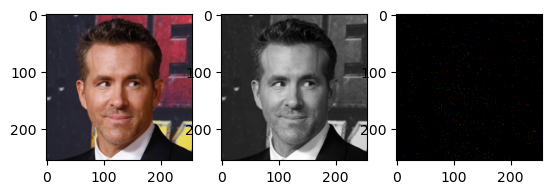

In [130]:
img = c_dataset[0]
img, gt, imgNoise = img[:3], img[3:4], img[4:]
plt.subplot(1, 3, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 3, 2)
plt.imshow(preprocess(gt), 'gray')
plt.subplot(1, 3, 3)
plt.imshow(preprocess(imgNoise))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/color/img.png', preprocess(img))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/color/gt.png', preprocess(gt))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/color/imgNoise.png', preprocess(imgNoise))

In [132]:
from BinomDataset_ffhq_super_res import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = -15
maxpsnr = -10
sr_dataset_ffhq = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 100, in_size= 64, out_size= 512)

In [133]:
from BinomDataset_ffhq_super_res import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/test/'
minpsnr = -15
maxpsnr = -10
sr_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 100, in_size= 64, out_size= 512)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


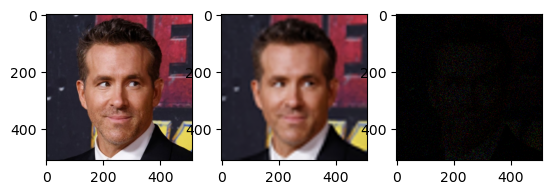

In [134]:
img = sr_dataset[0]
img, sr, imgNoise = img[:3], img[3:6], img[6:]
plt.subplot(1, 3, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 3, 2)
plt.imshow(preprocess(sr))
plt.subplot(1, 3, 3)
plt.imshow(preprocess(imgNoise))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/sr/img.png', preprocess(img))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/sr/sr.png', preprocess(sr))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/sr/imgNoise.png', preprocess(imgNoise))

In [4]:
from GAP_UNET_ResBlock_ffhq import UN
if not torch.cuda.is_available():
    raise ValueError("GPU not found, code will run on CPU and can be extremely slow!")
else:
    device = torch.device("cuda:0")

name = 'm40tom32.5-256x256-ffhq-inpainting-cascade'
CHECKPOINT_PATH = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/checkpoints/models/inpainting-cascade/256x256'

model1 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm32.5tom25-256x256-ffhq-inpainting-cascade'

model2 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm25tom17.5-256x256-ffhq-inpainting-cascade'

model3 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm17.5tom10-256x256-ffhq-inpainting-cascade'

model4 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm10tom2.5-256x256-ffhq-inpainting-cascade'

model5 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm2.5to5-256x256-ffhq-inpainting-cascade'

model6 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = '5to12.5-256x256-ffhq-inpainting-cascade'

model7 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

/home/ankith/anaconda3/envs/rsenv/lib/python3.10/site-packages/pytorch_lightning/utilities/migration/utils.py:56: The loaded checkpoint was produced with Lightning v2.4.0, which is newer than your current Lightning version: v2.3.2
/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap/GAP_UNET_ResBlock_ffhq.py:255: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
  init.xavier_normal(m.weight)
/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap/GAP_UNET_ResBlock_ffhq.py:256: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)


In [3]:
from GAP_UNET_ResBlock_ffhq import UN
if not torch.cuda.is_available():
    raise ValueError("GPU not found, code will run on CPU and can be extremely slow!")
else:
    device = torch.device("cuda:0")
    
name = 'm40tom32.5-256x256-ffhq-inpainting-cascade'
CHECKPOINT_PATH = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/checkpoints/models/inpainting-cascade/256x256'

model1 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

ModuleNotFoundError: No module named 'GAP_UNET_ResBlock_ffhq'

In [59]:
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = -9
maxpsnr = -7
in_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, imgsize= 256, masksize = 130)

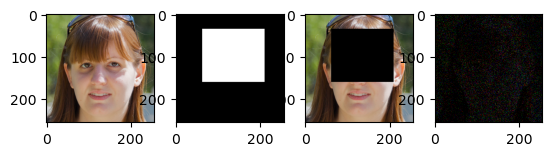

In [133]:
img = in_dataset[0]
img, mask, cond, imgNoise = img[:3], img[3:4], img[4:7], img[7:]
plt.subplot(1, 4, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 4, 2)
plt.imshow(preprocess(mask), 'gray')
plt.subplot(1, 4, 3)
plt.imshow(preprocess(cond))
plt.subplot(1, 4, 4)
plt.imshow(preprocess(imgNoise))

cond_input shape torch.Size([1, 4, 256, 256])
cond_img shape torch.Size([1, 4, 256, 256])
input_img shape torch.Size([1, 7, 256, 256])
input_img shape torch.float32
(1, 3, 256, 256)


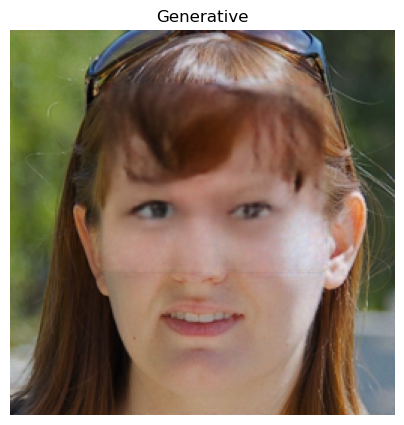

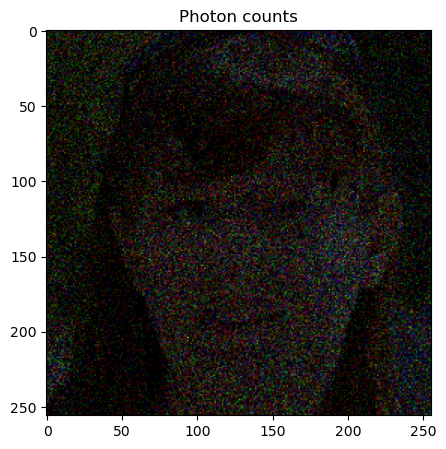

_______________________________________ 346
time (s): 42.73341751098633 time per image (s) 42.73341751098633


In [134]:
from inference_ffhq_cascade import sample_image
import matplotlib.image as mpimg
import time
import numpy as np


channels = 3
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 256
pixels_y = 256

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x)
# inp_img = imgNoise[None]

cond_input = torch.from_numpy(np.expand_dims(np.concatenate((mask, cond), axis = 0), axis = 0))
# cond_input = torch.from_numpy(np.expand_dims(np.concatenate((np.ones_like(mask), np.zeros_like(cond_test)), axis = 0), axis = 0))

print(f'cond_input shape {cond_input.shape}')

cond_img = cond_input
print(f'cond_img shape {cond_img.shape}')

# cond_img = torch.zeros_like(cond_img)
input_img = torch.cat((cond_img, inp_img), 1).to(device)
print(f'input_img shape {input_img.shape}')
print(f'input_img shape {input_img.dtype}')


for i in range(1):
    

    startTime = time.time()
    
    # sampling the image(s)
    denoised, photons, stack, iterations = sample_image(input_img,
                                                        [model1, model2, model3, model4, model5], #model6, #model7], 
                                                        beta = 0.005,
                                                        save_every_n = 10,
                                                        max_psnr = -33,
                                                        max_its = 50000000,
                                                        channels = 3)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):

            denoised/=denoised.mean()
            print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(denoised[0]), vmin = 0,
                       vmax = np.percentile(preprocess(denoised[0]),99.99))
            plt.title('Generative')
            plt.axis('off')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(photons[0]), vmin = 0,
                       vmax = np.percentile(preprocess(photons[0]),99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    
    
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print ('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])
   

In [37]:
len(stack)

151

In [116]:
for i in range(len(stack)):
    stack[i][0] = np.concatenate([stack[i][0], cond.numpy()/cond.numpy().max(), img.numpy()/img.numpy().max()], axis =2 )

0
psnr : -40


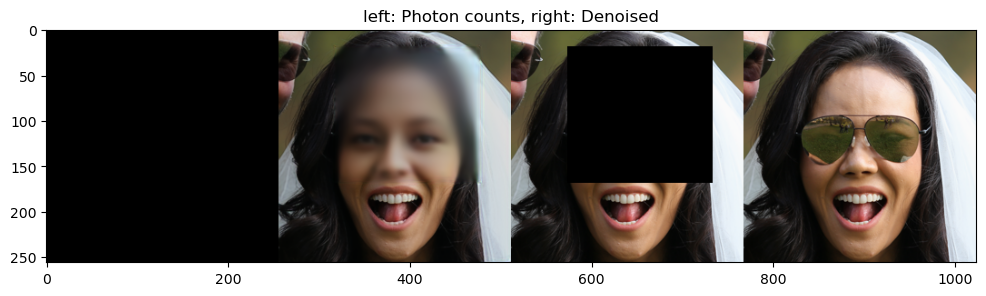

30
psnr : -28.121585568410566


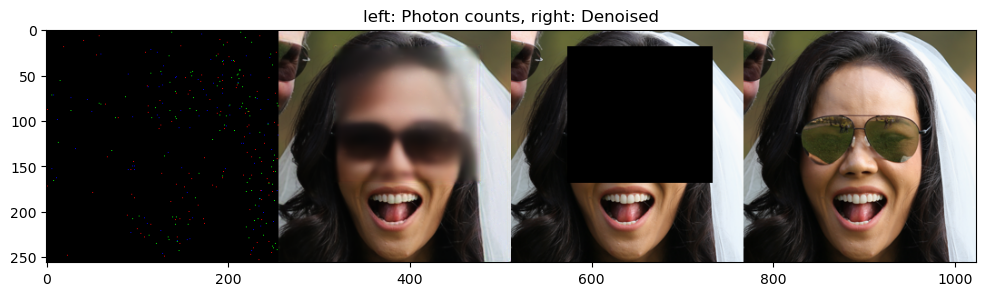

60
psnr : -21.987807836804983


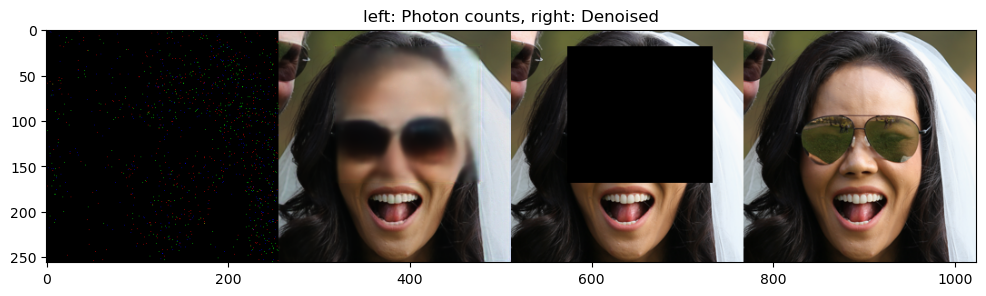

90
psnr : -15.499346543312045


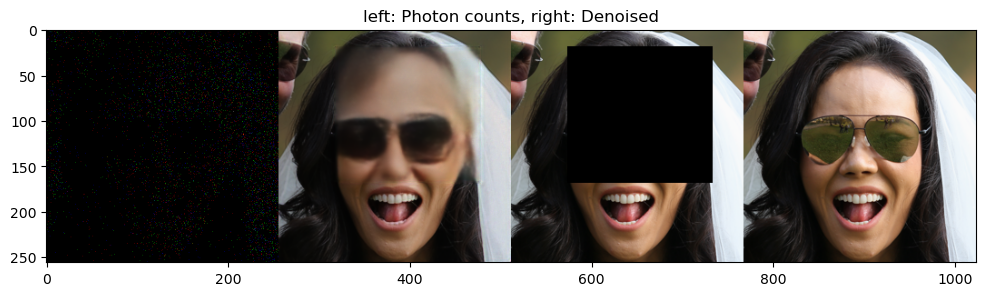

120
psnr : -9.107380032320977


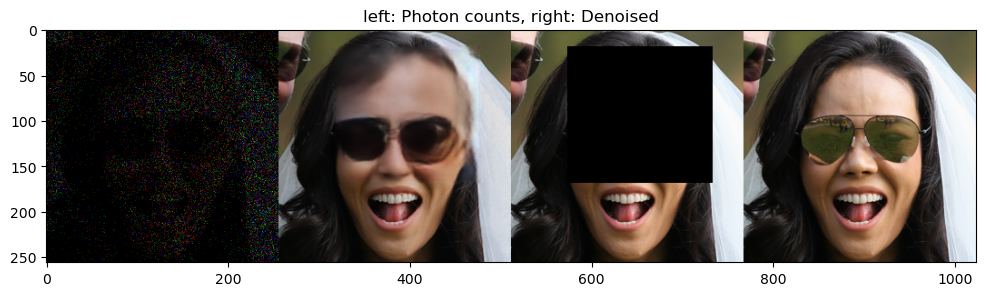

150
psnr : -2.6881596599201565


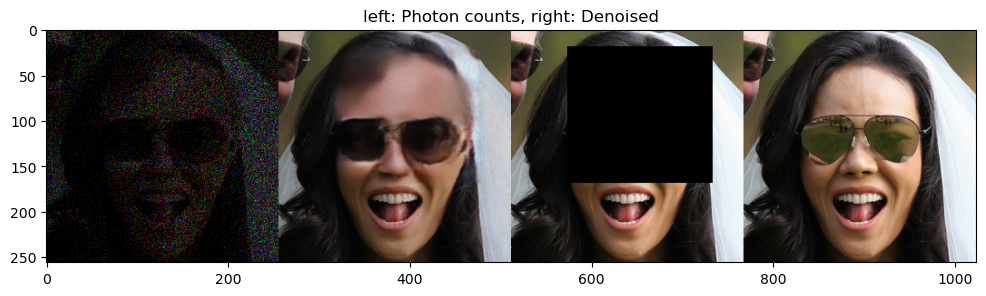

In [117]:
for i in range(len(stack)):
    if i%30 == 0 :
        im = (stack[i][0].transpose(1, 2, 0) * 255).astype(np.uint8)
        print(i)
        print(f'psnr : {stack[i][1]}')
        plt.figure(figsize = (12,12))
        plt.imshow(im, vmax = 0.9)
        plt.title('left: Photon counts, right: Denoised')
        plt.show()

In [118]:
from utils import stack_video
vidstack = []
for i in range(len(stack)):
    vidstack.append(stack[i][0])
file_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/inpaint/'
file_name = 'ffhq4.mp4'
stack_video(stack= vidstack, 
            filename= os.path.join(file_path, file_name),
            framerate = 10)

Video saved at /mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/inpaint/ffhq4.mp4 + v4


In [136]:
psnr(img[None].numpy(), denoised, data_range= img.numpy().max())

22.292369875352417

In [150]:
img.numpy().tolist()

[[[1.2248597145080566,
   1.2427408695220947,
   1.2695627212524414,
   1.2606221437454224,
   1.2606221437454224,
   1.2695627212524414,
   1.2785032987594604,
   1.2695627212524414,
   1.2874438762664795,
   1.3232061862945557,
   1.3410873413085938,
   1.3589684963226318,
   1.3500279188156128,
   1.3500279188156128,
   1.3500279188156128,
   1.3500279188156128,
   1.3589684963226318,
   1.3589684963226318,
   1.3410873413085938,
   1.3410873413085938,
   1.3410873413085938,
   1.3410873413085938,
   1.3232061862945557,
   1.3053250312805176,
   1.2963844537734985,
   1.2785032987594604,
   1.2516815662384033,
   1.2159191370010376,
   1.2248597145080566,
   1.2159191370010376,
   1.1801568269729614,
   1.1533350944519043,
   1.1354539394378662,
   1.1354539394378662,
   1.1443945169448853,
   1.1354539394378662,
   1.1354539394378662,
   1.1354539394378662,
   1.1533350944519043,
   1.1533350944519043,
   1.1622756719589233,
   1.1712162494659424,
   1.1712162494659424,
   1.171216

In [153]:
import tensorflow as tf
from tg.image import ssim

ModuleNotFoundError: No module named 'tensorflow'

In [5]:
from GAP_UNET_ResBlock_ffhq_color import UN
if not torch.cuda.is_available():
    raise ValueError("GPU not found, code will run on CPU and can be extremely slow!")
else:
    device = torch.device("cuda:0")


name = 'm40tom30-256x256-ffhq-colorization-noaug'
CHECKPOINT_PATH = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/checkpoints/models/colorization-cascade/'

cmodel1 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm30tom20-256x256-ffhq-colorization-noaug'

cmodel2 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm20tom10-256x256-ffhq-colorization-noaug'

cmodel3 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm10to0-256x256-ffhq-colorization-noaug'

cmodel4 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)


/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap/GAP_UNET_ResBlock_ffhq_color.py:255: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
  init.xavier_normal(m.weight)
/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap/GAP_UNET_ResBlock_ffhq_color.py:256: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)


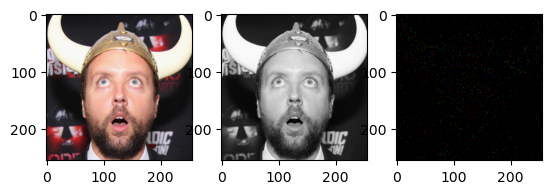

In [142]:
from BinomDataset_ffhq_color_noaug import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = -30
maxpsnr = -20
c_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, scale = 1, imgsize= 256)
img = c_dataset[13735 - 2000]
img, cond, imgNoise = img[:3], img[3:4], img[4:]
plt.subplot(1, 3, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 3, 2)
plt.imshow(preprocess(cond), 'gray')
plt.subplot(1, 3, 3)
plt.imshow(preprocess(imgNoise))

In [126]:
input_img[:,-3:, :, :]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], device='cuda:0')

cond_input shape torch.Size([1, 1, 256, 256])
cond_img shape torch.Size([1, 1, 256, 256])
input_img shape torch.Size([1, 4, 256, 256])
input_img shape torch.float32
(1, 3, 256, 256)


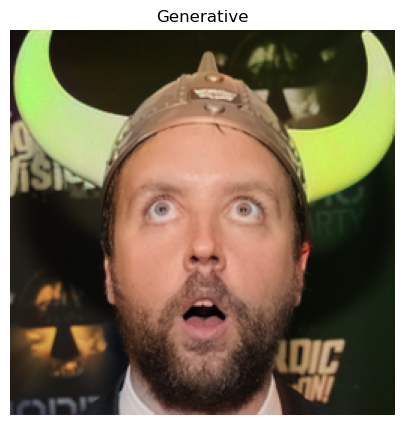

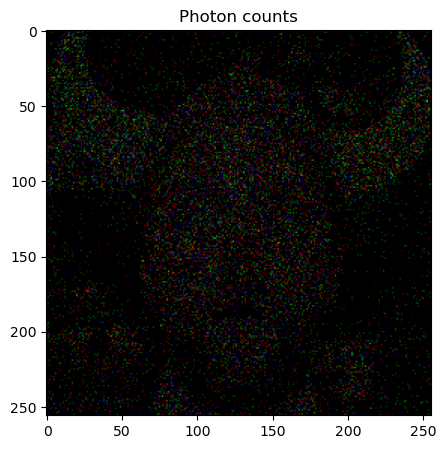

_______________________________________ 348
time (s): 34.369799852371216 time per image (s) 34.369799852371216


In [143]:
from inference_ffhq_cascade import sample_image
import matplotlib.image as mpimg
import time
import numpy as np


channels = 3
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 256
pixels_y = 256

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x)

cond_input = torch.from_numpy(np.expand_dims(cond, axis = 0))
print(f'cond_input shape {cond_input.shape}')

cond_img = cond_input
print(f'cond_img shape {cond_img.shape}')

# cond_img = torch.zeros_like(cond_img)
input_img = torch.cat((cond_img, inp_img), 1).to(device)
print(f'input_img shape {input_img.shape}')
print(f'input_img shape {input_img.dtype}')

for i in range(1):
    

    startTime = time.time()
    
    # sampling the image(s)
    denoised, photons, stack, iterations = sample_image(input_img,
                                                        [cmodel1, cmodel2, cmodel3, cmodel4], 
                                                        beta = 0.005,
                                                        save_every_n = 10,
                                                        max_psnr = -33,
                                                        max_its = 50000000,
                                                        channels = 3,
                                                        grayscale = False)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):

            denoised/=denoised.mean()
            print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(denoised[0]), vmin = 0,
                       vmax = np.percentile(preprocess(denoised[0]),99.99))
            plt.title('Generative')
            plt.axis('off')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(photons[0]), vmin = 0,
                       vmax = np.percentile(preprocess(photons[0]),99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    
    
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print ('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])
   

In [112]:
len(stack)

114

In [144]:
for i in range(len(stack)):
    stack[i][0] = np.concatenate([stack[i][0], img.numpy()/img.numpy().max()], axis =2 )

0
psnr : -40


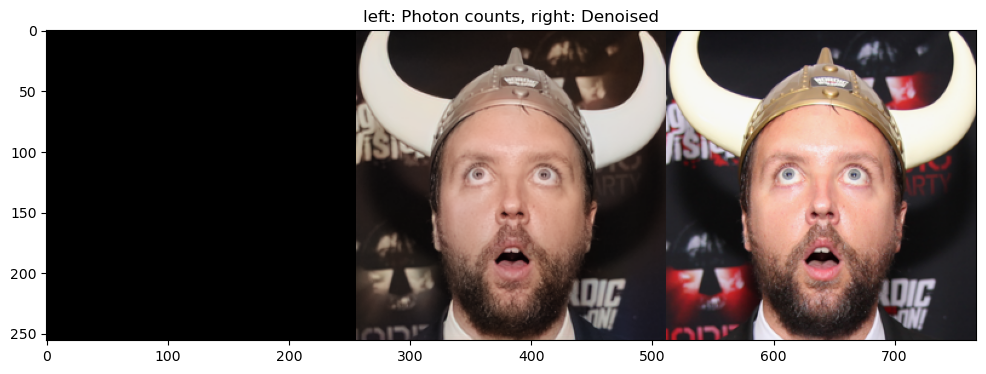

15
psnr : -31.175099262876806


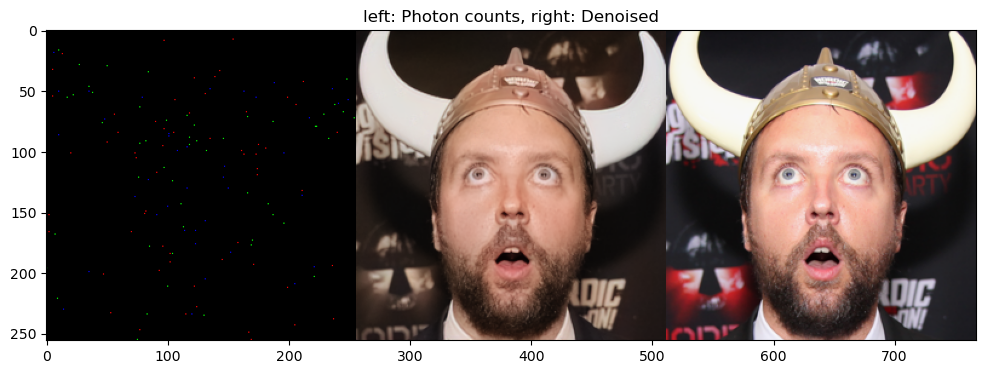

30
psnr : -27.80383564947791


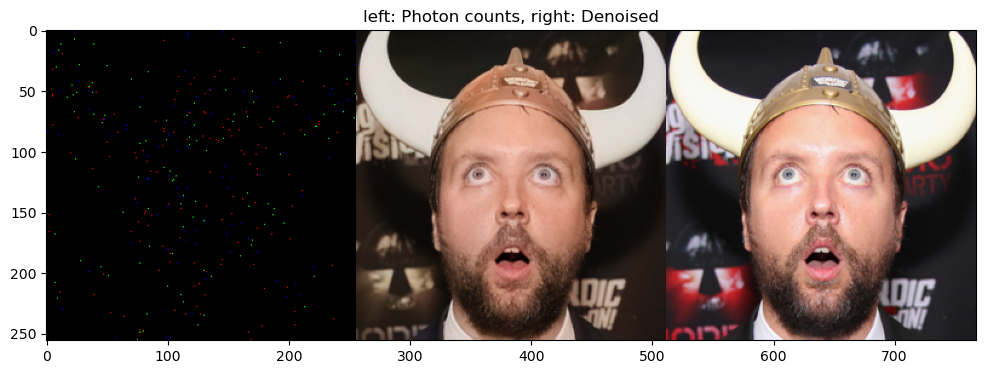

45
psnr : -24.78023437019094


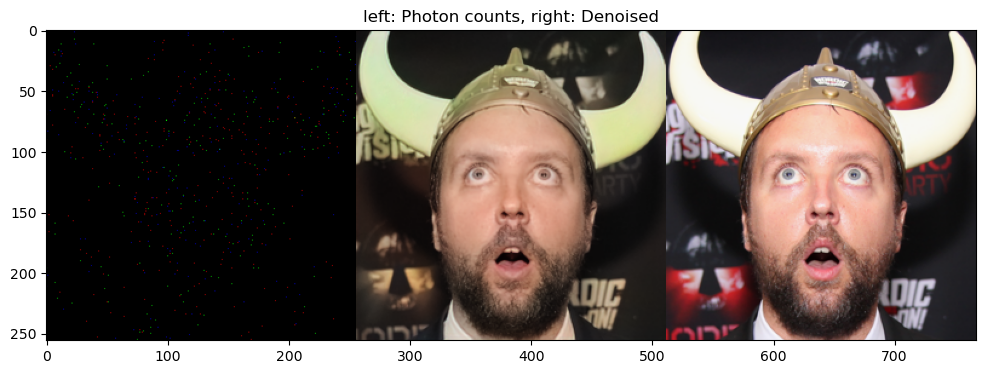

60
psnr : -21.493383925661405


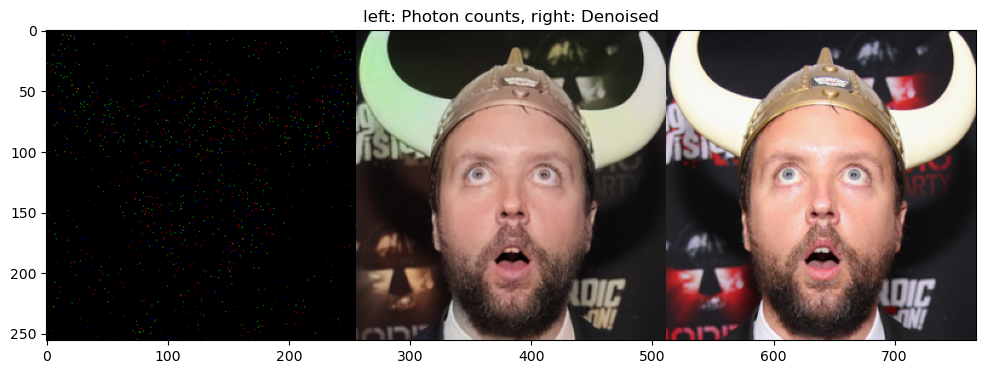

75
psnr : -18.254015902516162


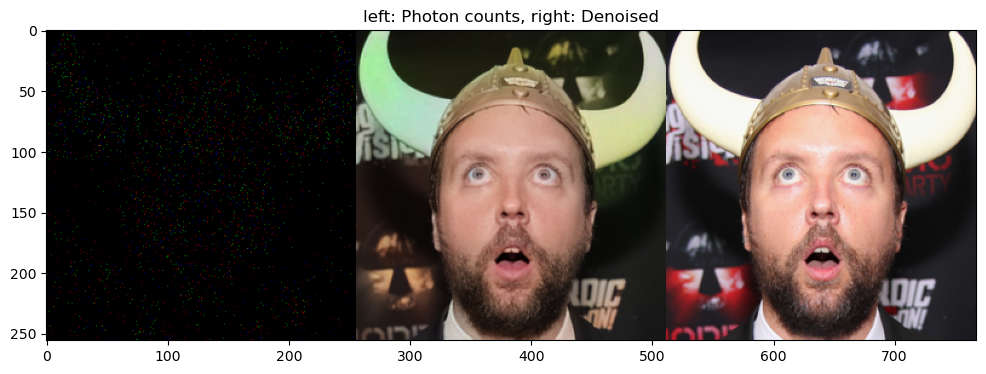

90
psnr : -15.134999938754499


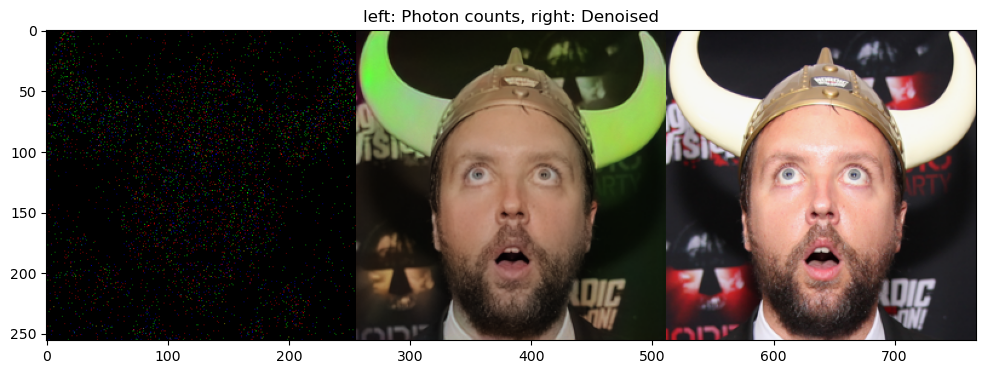

105
psnr : -11.84799444714926


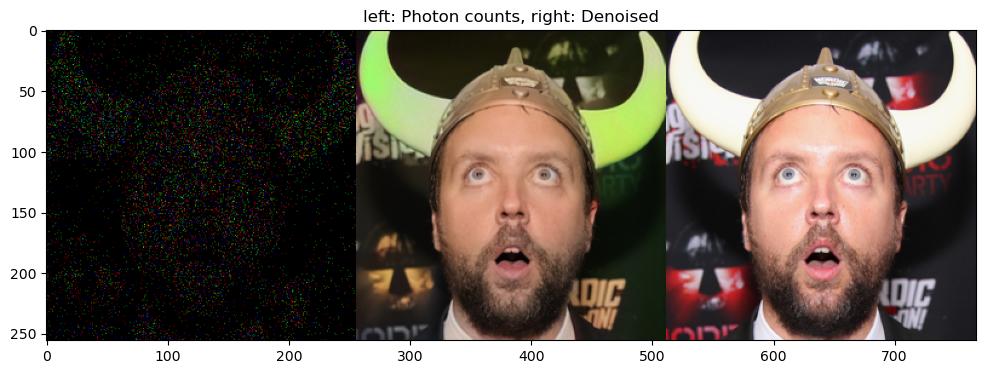

In [145]:
for i in range(len(stack)):
    if i%15 == 0 :
        im = (stack[i][0].transpose(1, 2, 0) * 255).astype(np.uint8)
        print(i)
        print(f'psnr : {stack[i][1]}')
        plt.figure(figsize = (12,12))
        plt.imshow(im)
        plt.title('left: Photon counts, right: Denoised')
        plt.show()

In [146]:
from utils import stack_video
vidstack = []
for i in range(len(stack)):
    vidstack.append(stack[i][0])
file_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/inpaint/'
file_name = 'ffhq4.mp4'
stack_video(stack= vidstack, 
            filename= os.path.join(file_path, file_name),
            framerate = 10)

Video saved at /mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/inpaint/ffhq4.mp4 + v4


In [56]:
denoised.shape, img.shape, denoised.mean(), img.min()

((1, 3, 256, 256), torch.Size([3, 256, 256]), 1.0000001, tensor(0.))

In [43]:
img.max() - img.min(), denoised.max() - denoised.min()

(tensor(3.1658), 3.362934)

In [62]:
psnr(img[None].numpy(), denoised, data_range= img.numpy().max())

20.752669023745728

In [45]:
[21.726816312129984]

[21.726816312129984]

In [5]:
from GAP_UNET_ResBlock_ffhq_super_res import UN
if not torch.cuda.is_available():
    raise ValueError("GPU not found, code will run on CPU and can be extremely slow!")
else:
    device = torch.device("cuda:0")
name = 'm40to30-256x256-ffhq-super-res'
CHECKPOINT_PATH = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/checkpoints/models/'

srmodel = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


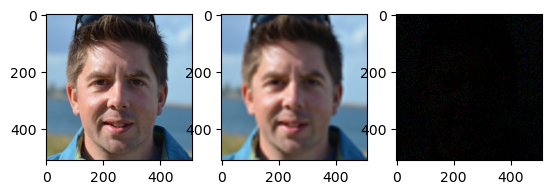

In [67]:
from BinomDataset_ffhq_super_res import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = -15
maxpsnr = -10
sr_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 100, in_size= 64, out_size= 512)
img = sr_dataset[0]
img, cond, imgNoise = img[:3], img[3:6], img[6:]
plt.subplot(1, 3, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 3, 2)
plt.imshow(preprocess(cond))
plt.subplot(1, 3, 3)
plt.imshow(preprocess(imgNoise))

In [15]:
cond.shape

torch.Size([3, 512, 512])

cond_input shape torch.Size([1, 3, 512, 512])
cond_img shape torch.Size([1, 3, 512, 512])
input_img shape torch.Size([1, 6, 512, 512])
input_img shape torch.float32
(1, 3, 512, 512)


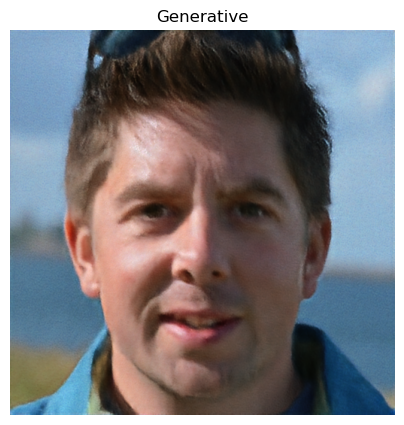

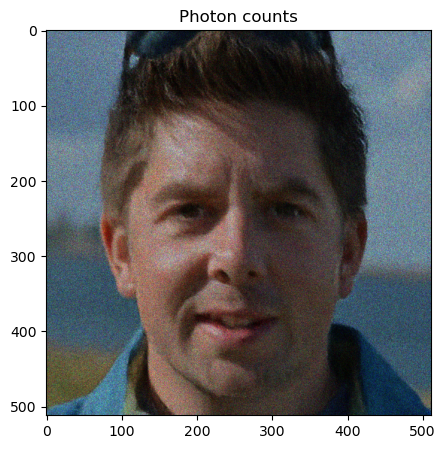

_______________________________________ 2625
time (s): 124.66078758239746 time per image (s) 124.66078758239746


In [68]:
from inference_ffhq import sample_image
import time
channels = 3
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 512
pixels_y = 512

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x)

cond_input = cond[None]
print(f'cond_input shape {cond_input.shape}')
# inp_img = dataTest[None]
cond_img = cond_input
print(f'cond_img shape {cond_img.shape}')

# cond_img = torch.zeros_like(cond_img)
input_img = torch.cat((cond_img, inp_img), 1).to(device)
print(f'input_img shape {input_img.shape}')
print(f'input_img shape {input_img.dtype}')


for i in range(1):

    startTime = time.time()
    
    # sampling the image(s)
    denoised, photons, stack, iterations = sample_image(input_img,
                                                        srmodel, 
                                                        beta = 0.005,
                                                        save_every_n = 20,
                                                        max_psnr = 15,
                                                        max_its = 20000000,
                                                        channels = 3)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):

            denoised/=denoised.mean()
            print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(denoised[0]), vmin = 0,
                       vmax = np.percentile(denoised[0],99.99))
            plt.title('Generative')
            plt.axis('off')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(photons[0]), vmin = 0,
                       vmax = np.percentile(photons[j],99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    
    
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print ('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])
   

In [70]:
len(stack)

132

In [69]:
for i in range(len(stack)):
    stack[i][0] = np.concatenate([stack[i][0], cond.numpy()/cond.numpy().max(), img.numpy()/img.numpy().max()], axis =2 )

0
psnr : -40


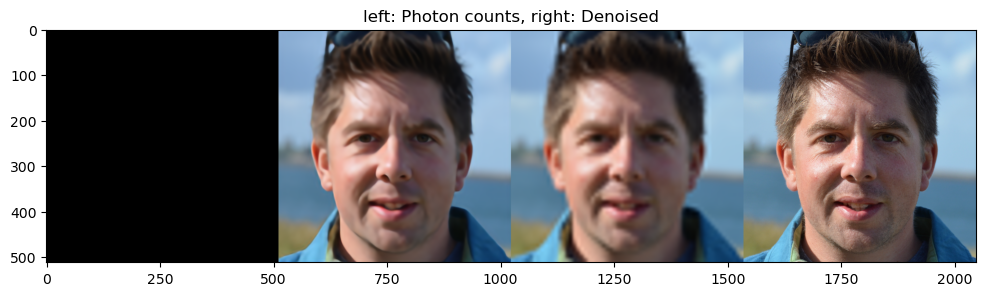

20
psnr : -32.93601152209323


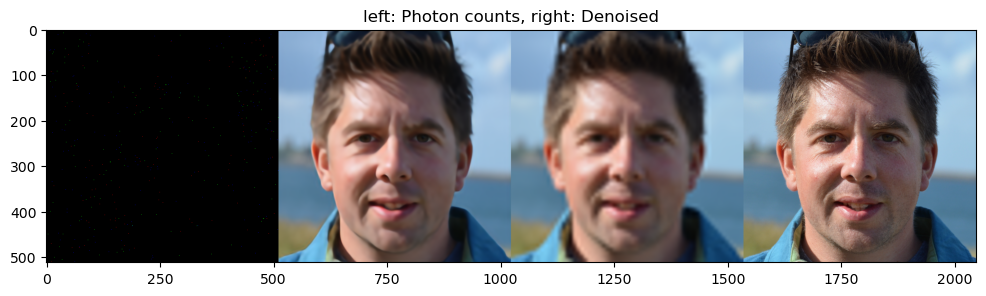

40
psnr : -24.305758800298506


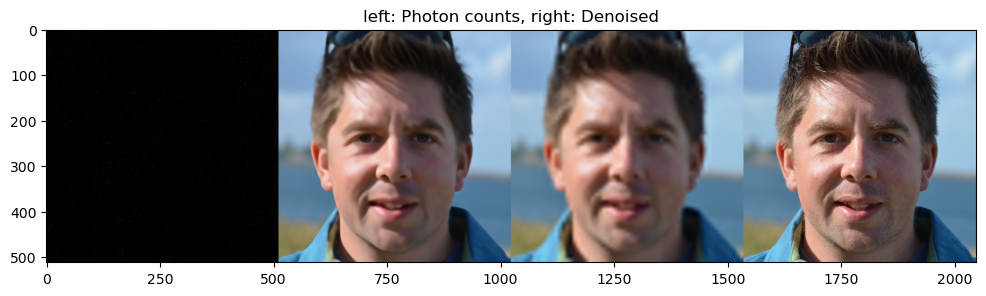

60
psnr : -15.819837174728606


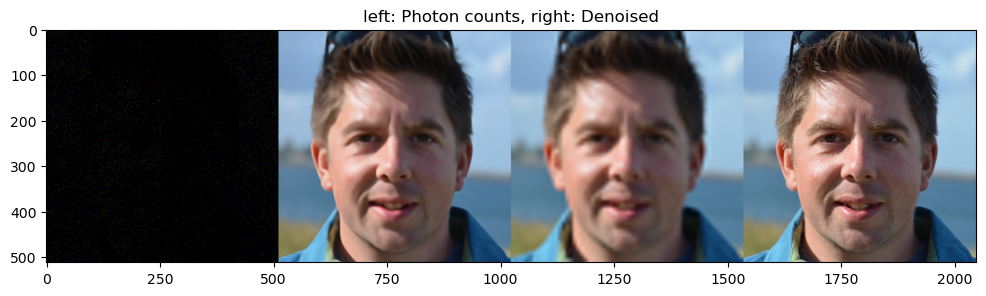

80
psnr : -7.170525179231851


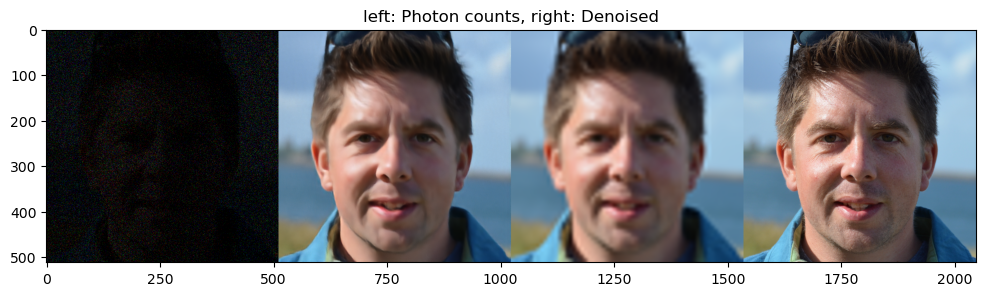

100
psnr : 1.4585743562809996


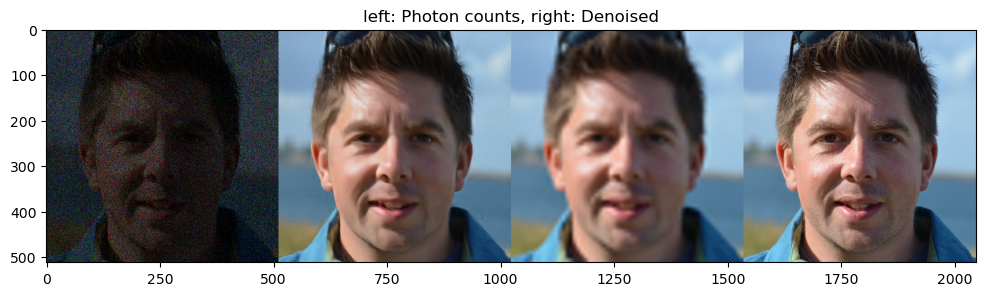

120
psnr : 10.12468339305432


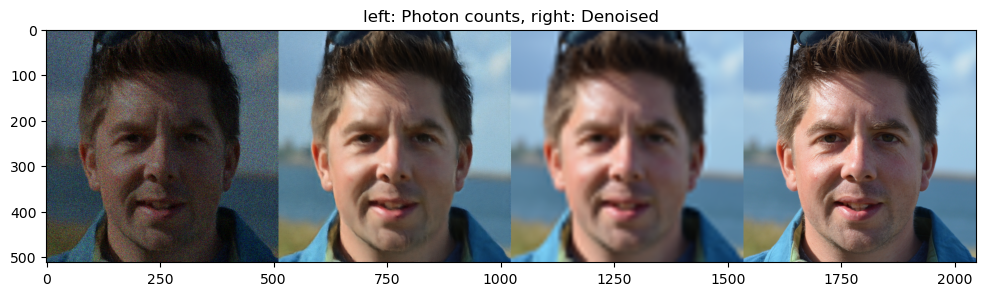

In [71]:
for i in range(len(stack)):
    if i%20 == 0 :
        im = (stack[i][0].transpose(1, 2, 0) * 255).astype(np.uint8)
        print(i)
        print(f'psnr : {stack[i][1]}')
        plt.figure(figsize = (12,12))
        plt.imshow(im, vmax = 0.9)
        plt.title('left: Photon counts, right: Denoised')
        plt.show()

In [72]:
from utils import stack_video
vidstack = []
for i in range(len(stack)):
    vidstack.append(stack[i][0])
file_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/sr/'
file_name = 'ffhq4.mp4'
stack_video(stack= vidstack, 
            filename= os.path.join(file_path, file_name),
            framerate = 10)

Video saved at /mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/sr/ffhq4.mp4 + v4


In [73]:
psnr(img[None].numpy(), denoised, data_range= img.numpy().max())

27.87877782541768